In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torchvision.models.resnet import BasicBlock, ResNet
import logging
import numpy as np
from collections import OrderedDict
import functools
import wandb
import random
import os
import matplotlib.pyplot as plt
from datasources.EyediapTest import EyediapLoaderTest

from torch.utils.data import DataLoader, Subset
from datasources import EVESequences_train, EVESequences_test, EVESequences_val
from core import DefaultConfig
from torch.optim.lr_scheduler import ExponentialLR

from torch.utils.tensorboard import SummaryWriter
import time
from datetime import datetime, timezone
from model.eyenet import EyeNet
from model.eyenet_frame import EyeNetFrame
from utils.loss import BaseLossWithValidity, L1Loss, AngularLoss, EuclideanLoss
from utils.util_functions import pitchyaw_to_vector
from utils.util_functions import to_screen_coordinates, apply_rotation, apply_transformation, get_intersect_with_zero
from utils.util_functions import set_seed
from core.training import init_datasets_eval
from core import DefaultConfig, training
from datasources import EVESequencesBase, EVESequences_train, EVESequences_val, EVESequences_test  # for i,data in enumerate(test_dataloader):
from model.facenet_transformer import FaceNetTransformer
from model.face_mixste import FaceMixSTE

logger = logging.getLogger(__name__)
config = DefaultConfig()

hp = {
    'eye_net_rnn_num_features': 128,
    'eye_net_rnn_num_cells': 1,
    'batch_size': 16,
    'epoch_num': 10,
    'sequence_length': 30,
    'saving_dir': './saving',
}

def gazeto3d(gaze):
  gaze_gt = np.zeros([3])
  gaze_gt[0] = -np.cos(gaze[1]) * np.sin(gaze[0])
  gaze_gt[1] = -np.sin(gaze[1])
  gaze_gt[2] = -np.cos(gaze[1]) * np.cos(gaze[0])
  return gaze_gt

def angular(gaze, label):
  total = np.sum(gaze * label)
  return np.arccos(min(total/(np.linalg.norm(gaze)* np.linalg.norm(label)), 0.9999999))*180/np.pi


set_seed(1024)

train_dataset_paths = [
        ('eve_train', EVESequences_train, '/root/autodl-tmp/eve_dataset/eve_dataset', config.train_stimuli, config.train_cameras),  # noqa
    ]
validation_dataset_paths = [
    ('eve_val', EVESequences_val, '/root/autodl-tmp/eve_dataset/eve_dataset', config.test_stimuli, config.test_cameras),
]
train_data, test_data = init_datasets_eval(train_dataset_paths, validation_dataset_paths)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device: {}".format(torch.cuda.get_device_name(device)))

# model = EyeNetFrame().to(device)
model = FaceNetTransformer().to(device)
# model = FaceMixSTE().to(device)
model.load_state_dict(torch.load("/root/autodl-tmp/projects/m2ff/saving/eveframe_epoch_9_batch_2034_time_20240824_093923.pth"))
model.eval()

Using device: NVIDIA L20


FaceNetTransformer(
  (cnn_layer): MyResNet18(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (downsample1): Sequential(
      (0): Conv2d(320, 5, kernel_size=(1, 1), stride=(1, 1))
      (1): InstanceNorm2d(5, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    )
    (downsample1_1): Sequential(
      (0): Conv2d(45, 30, kernel_size=(1, 1), stride=(1, 1))
      (1): InstanceNorm2d(30, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    )
    (downsample1_1_1): Sequential(
      (0): Conv2d(45, 30, kernel_size=(1, 1), stride=(1, 1))
      (1): InstanceNorm2d(30, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    )
    (downsample2): Sequential(
      (0): Conv2d(640, 5, ke

In [2]:
my_dict = None

In [3]:
test_dataloader = test_data['eve_val']['dataloader']
with torch.no_grad():
    for i, test_data in enumerate(test_dataloader):
        my_dict = test_data
        
        break

dict

In [2]:
test_dataloader = test_data['eve_val']['dataloader']
        

    

    


In [ ]:
with torch.no_grad():
    for b, test_data in enumerate(test_dataloader):
        if b == 478:
                break
        for k, v in test_data.items():
                if isinstance(v, torch.Tensor):
                    test_data[k] = v.to(device)
        my_dict_out = model(test_data)
        print('next!')
        for i in range(my_dict_out['face_patch'].shape[0]):
            g_preds = my_dict_out['face_g_initial'][i].cpu().detach().numpy()
            g_gt = my_dict_out['face_g_tobii'][i].cpu().detach().numpy()
            face_patch = (my_dict_out['face_patch'][i] + 1.0) * (255.0 / 2.0)
            face_patch = face_patch.permute(0,2, 3, 1).cpu().detach().numpy().astype(np.uint8)
            fig, axs = plt.subplots(3, 10, figsize=(20, 6)) 
            length = 200.0
            g_gt_dx = -length * np.cos(g_gt[:, 0]) * np.sin(g_gt[:, 1])
            g_gt_dy = -length * np.sin(g_gt[:, 0])
            g_preds_dx = -length * np.cos(g_preds[:, 0]) * np.sin(g_preds[:, 1])
            g_preds_dy = -length * np.sin(g_preds[:, 0])
        
            for j in range(30):
                ax = axs[j // 10, j % 10]
                ax.imshow(face_patch[j])
                ax.axis('off')
        
                height, width = face_patch[j].shape[:2]
                center_x, center_y = width // 2, height // 2
        
                ax.annotate('', xy=(center_x + g_gt_dx[j], center_y + g_gt_dy[j]), xytext=(center_x, center_y),
                            arrowprops=dict(facecolor='red', edgecolor='none', alpha=1, shrink=0, width=2, headwidth=5))
        
                ax.annotate('', xy=(center_x + g_preds_dx[j], center_y + g_preds_dy[j]), xytext=(center_x, center_y),
                            arrowprops=dict(facecolor='blue', edgecolor='none', alpha=0.85, shrink=0, width=1.5, headwidth=5))
        
                text_str = f"GT: ({g_gt[j, 0]:.2f}, {g_gt[j, 1]:.2f})\nPred: ({g_preds[j, 0]:.2f}, {g_preds[j, 1]:.2f})"
                ax.text(4, 4, text_str, color='white', fontsize=6, verticalalignment='top', horizontalalignment='left',
                        bbox=dict(facecolor='black', alpha=0.5, boxstyle='round,pad=0.1'))
            
            # predict_patch = mpatches.Patch(color='blue', label='Prediction')
            # ground_truth_patch = mpatches.Patch(color='red', label='Ground Truth')
        
            # fig.legend(handles=[predict_patch, ground_truth_patch], loc='upper right', bbox_to_anchor=(0.85, 1.0), borderaxespad=0.)
            # fig.suptitle('Visual Comparison of GT and Predicted Values', fontsize=13)
        
        
            # 使用subplots_adjust调整子图间的横向间隔和右边界，为图例腾出空间
            plt.subplots_adjust(wspace=0.1, hspace=0.1)  # 调整right以留出足够空间

            gazes = my_dict_out['face_g_initial'][i].reshape(-1, 2)
            gt = my_dict_out['face_g_tobii'][i].reshape(-1,2)
            angle = 0
            count = 0
            
            for k, gaze in enumerate(gazes):
                count += 1
                gaze = gaze.cpu().detach().numpy()  # 这是 PyTorch 张量的操作
                gt_k = gt.cpu().detach().numpy()[k]  # 直接使用 gaze_gt[k]，因为 gaze_gt 已经是 NumPy 数组
                plus = angular(gazeto3d(gaze), gazeto3d(gt_k))
                if plus >= 10:
                    count -= 1
                    continue
                angle += plus
            angle /= count
            
            
            # 保存图片
            # print(my_dict_out['loss_ang_face_g_initial'])
            print(angle)
            plt.savefig(f'/root/autodl-tmp/projects/m2ff/infer/{b}_{i}_{angle}.png')
        
            # plt.show()

/root/miniconda3/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


next!
1.812984247637692
7.000239365667217
1.018912998539998
2.2920369810684003
4.416411462235086
0.8534079856599559
2.6037868649738902
0.9567513385862815
0.686670388707443
1.8874839747240808
2.032028076389427
1.4271039872720437
3.1897307029990536
3.540793283085752
2.6401174039228255
2.171625985114006
next!
2.1547557858634674
0.7250752461531716
3.1694683765067464
1.0806296271888791


/tmp/ipykernel_92697/52424132.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(3, 10, figsize=(20, 6))


5.170646060234066
1.3024331771931197
1.2064134966941567
2.984939400677092
1.368702574182984
1.7306015397391936
2.0992336584784774
6.706110265453545
1.6048577564515498
2.924326215322076
1.1635212718921606
1.3634075147249314
next!
2.984939400677092
2.786738536708226
2.064471872672708
1.3418182806085925
7.397864400899718
3.252433808794282
1.0541626557566826
1.4209676241678557
6.706110265453545
6.84906318297277
3.057309871225434
5.352112938762349
3.133020177477548
0.87044025570643
1.7634932048884537
1.4015285421209305
next!
4.601662126154343
1.2044233779807816
2.966295077826931
3.540793283085752
1.0357474738167656
0.9488398602350844
5.1313722097852255
1.2787471540671258
2.611673136048488
2.954987085184156
3.184735728542296
1.689198175050348
2.1300435392752437
5.314881534810783
5.582689449675693
2.302800751483789
next!
1.118431277146957
1.2836076470398396
1.6588983991108224
1.341707448411199
7.639388626576285
1.9776453254276931
2.0641317147349736
0.901511481966261
2.180704395543071
4.916562

In [5]:
for k,v in my_dict.items():
    print(k)

camera_matrix
camera_transformation
face_PoG_tobii
face_PoG_tobii_validity
face_R
face_R_validity
face_W
face_W_validity
face_g_tobii
face_g_tobii_validity
face_h
face_h_validity
face_o
face_o_validity
facial_landmarks
facial_landmarks_validity
head_rvec
head_rvec_validity
head_tvec
head_tvec_validity
inv_camera_transformation
left_PoG_tobii
left_PoG_tobii_validity
left_R
left_R_validity
left_W
left_W_validity
left_g_tobii
left_g_tobii_validity
left_h
left_h_validity
left_o
left_o_validity
left_p
left_p_validity
millimeters_per_pixel
pixels_per_millimeter
right_PoG_tobii
right_PoG_tobii_validity
right_R
right_R_validity
right_W
right_W_validity
right_g_tobii
right_g_tobii_validity
right_h
right_h_validity
right_o
right_o_validity
right_p
right_p_validity
head_R
timestamps
left_eye_patch
right_eye_patch
face_patch
participant
subfolder
camera


In [43]:
model.eval()
for k, v in my_dict.items():
    if isinstance(v, torch.Tensor):
        my_dict[k] = v.to(device)
my_dict_out = model(my_dict)
for k,v in my_dict_out.items():
    print(k, v.shape)

face_g_initial torch.Size([16, 30, 2])
face_patch torch.Size([16, 30, 3, 256, 256])
face_g_tobii torch.Size([16, 30, 2])
face_PoG_tobii torch.Size([16, 30, 2])
face_PoG_cn_tobii torch.Size([16, 30, 2])
face_g_tobii_validity torch.Size([16, 30])
face_PoG_cm_initial torch.Size([16, 30, 2])
face_PoG_px_initial torch.Size([16, 30, 2])
loss_ang_face_g_initial torch.Size([])
full_loss torch.Size([])


In [44]:
print(my_dict_out['loss_ang_face_g_initial'])

tensor(2.3682, device='cuda:0', grad_fn=<DivBackward0>)


In [45]:
# 预测注视方向 o
# 真实注视方向 o
# 预测点 o
# 真实点 o
# 脸图 o
# 算出角度差 也可以算距离差

In [46]:
predict_g_0 = my_dict_out['face_g_initial'][0]
gt_g_0 = my_dict_out['face_g_tobii'][0]
face_patch_0 = my_dict_out['face_patch'][0]
predict_pog_cm = my_dict_out['face_PoG_cm_initial'][0]
gt_pog_cm = my_dict_out['face_PoG_cn_tobii'][0]
angle_diff_0 = my_dict_out['loss_ang_face_g_initial']

print('predict_g_0', predict_g_0, predict_g_0.shape)
print('gt_g_0', gt_g_0, gt_g_0.shape)
print('predict_pog_cm', predict_pog_cm, predict_pog_cm.shape)
print('gt_pog_cm', gt_pog_cm, gt_pog_cm.shape)
print(angle_diff_0)


predict_g_0 tensor([[-0.3115, -0.4896],
        [-0.2830, -0.4719],
        [-0.2715, -0.4441],
        [-0.2509, -0.3772],
        [-0.2479, -0.3769],
        [-0.2814, -0.4638],
        [-0.2989, -0.5183],
        [-0.2976, -0.4841],
        [-0.2694, -0.3951],
        [-0.2556, -0.3896],
        [-0.2457, -0.3499],
        [-0.2656, -0.3647],
        [-0.2668, -0.3684],
        [-0.2809, -0.3693],
        [-0.3366, -0.3904],
        [-0.3246, -0.3728],
        [-0.2574, -0.2925],
        [-0.2563, -0.2987],
        [-0.2530, -0.3068],
        [-0.2713, -0.3673],
        [-0.2806, -0.3700],
        [-0.3265, -0.3672],
        [-0.3231, -0.3714],
        [-0.3314, -0.3920],
        [-0.3227, -0.6777],
        [-0.3124, -0.6581],
        [-0.3000, -0.6621],
        [-0.2913, -0.6359],
        [-0.3132, -0.6252],
        [-0.3636, -0.2686]], device='cuda:0', grad_fn=<SelectBackward0>) torch.Size([30, 2])
gt_g_0 tensor([[-0.3030, -0.5277],
        [-0.2779, -0.4933],
        [-0.2743, -0

In [47]:
angle = 0
count = 0
gazes = my_dict_out['face_g_initial'].reshape(-1, 2)
gaze_gt = my_dict_out['face_g_tobii'].reshape(-1, 2)
val = my_dict_out['face_g_tobii_validity'].reshape(480)

for k, gaze in enumerate(gazes):
    count += 1
    gaze = gaze.cpu().detach().numpy()  # 这是 PyTorch 张量的操作
    gaze_gt_k = gaze_gt.cpu().detach().numpy()[k]  # 直接使用 gaze_gt[k]，因为 gaze_gt 已经是 NumPy 数组
    val_k = val.cpu().detach().numpy()[k]
    # print(type(gaze))
    # print(type(gaze_gt_k))
    plus = angular(gazeto3d(gaze), gazeto3d(gaze_gt_k))
    # if plus >= 10:
    #     count -= 1
    #     continue
    print(gaze, gaze_gt_k, val_k)
    print(plus)
    angle += plus
angle /= count
print(angle)


[-0.31153455 -0.4896434 ] [-0.3029893 -0.5276708] True
2.22036688067725
[-0.28304216 -0.47189718] [-0.2778527  -0.49331862] True
1.2552959167927022
[-0.27149603 -0.4441492 ] [-0.27430362 -0.49039236] True
2.6534270452703295
[-0.25094917 -0.3771795 ] [-0.2583954 -0.3973779] True
1.2228480022257502
[-0.2478756  -0.37686962] [-0.25451842 -0.39438596] True
1.0637650405266066
[-0.2813768 -0.4637612] [-0.30206832 -0.5435933 ] True
4.690289322459577
[-0.29886013 -0.5183499 ] [-0.30292022 -0.5469021 ] True
1.6481504063310206
[-0.29756758 -0.48412392] [-0.3060561 -0.5460257] True
3.5718582904039433
[-0.26943964 -0.39514902] [-0.27745235 -0.41693273] True
1.317448136464828
[-0.25564724 -0.38964096] [-0.25198445 -0.37895116] True
0.6426386311364414
[-0.2456988  -0.34991446] [-0.25309095 -0.37219295] True
1.3365441258532278
[-0.2656356  -0.36465344] [-0.28150892 -0.37840578] True
1.1571417736492104
[-0.26676974 -0.36836413] [-0.28026894 -0.37783432] True
0.901747159750621
[-0.28089097 -0.3693493 ]

In [48]:
face_patch_0 = (face_patch_0 + 1.0) * (255.0 / 2.0)
face_patch_0 = face_patch_0.permute(0, 2, 3, 1).cpu().detach().numpy().astype(np.uint8)
    


In [49]:
gt_dx.shape

(30,)

In [35]:

# gt_dx  = -200 * np.cos(gt_g_0[0]) * np.sin(gt_g_0[1])
# gt_dy  = -200 * np.sin(gt_g_0[1])
# predict_dx = -200 * np.cos(predict_g_0[0]) * np.sin(predict_g_0[1])
# predict_dy = -200 * np.sin(predict_g_0[1])

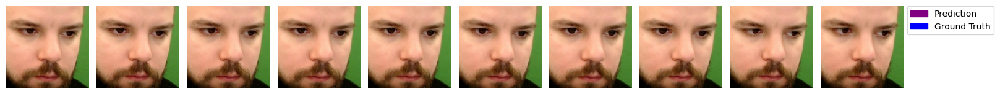

In [50]:
# # 画出人脸图像, 30张图，画成3*10的形式
# fig, axs = plt.subplots(3, 10, figsize=(20, 6))
# for i in range(30):
#     ax = axs[i // 10, i % 10]
#     ax.imshow(face_patch_0[i])
#     ax.axis('off')
# plt.subplots_adjust(wspace=0.1, hspace=0.1) 
# plt.show()
import matplotlib.patches as mpatches

# 假设face_patch_0是包含图像数据的列表
selected_indices = range(0, 30, 3)  # 每隔3个选择一个，共10个

# 创建一个1*10的子图布局
fig, axs = plt.subplots(1, 10, figsize=(20, 2))  # 更改为1行10列，调整figsize以适应横向长度

for idx, ax in zip(selected_indices, axs):
    ax.imshow(face_patch_0[idx])  # 索引从selected_indices取
    ax.axis('off')

# 创建伪线条用于图例
predict_patch = mpatches.Patch(color='purple', label='Prediction')
ground_truth_patch = mpatches.Patch(color='blue', label='Ground Truth')

# 添加图例到图外的右侧
plt.legend(handles=[predict_patch, ground_truth_patch], loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# 使用subplots_adjust调整子图间的横向间隔和右边界，为图例腾出空间
plt.subplots_adjust(wspace=0.1, right=0.85)  # 调整right以留出足够空间

plt.show()

In [ ]:
gt_g_0 = gt_g_0.cpu().detach().numpy()
predict_g_0 = predict_g_0.cpu().detach().numpy()

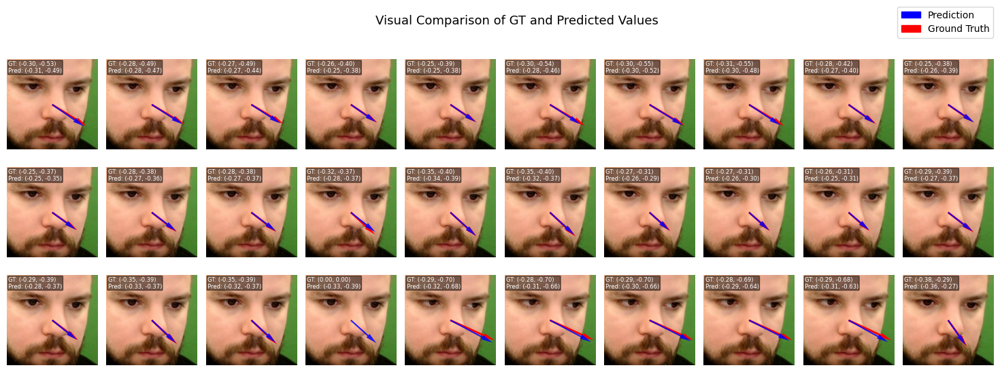

In [97]:
# 假设 face_patch_0 是包含图像数据的列表
fig, axs = plt.subplots(3, 10, figsize=(20, 6))  # 更改为3行10列，调整figsize以适应更多图片

length = 200.0  # 箭头长度

# 计算所有dx, dy
gt_dx = -length * np.cos(gt_g_0[:, 0]) * np.sin(gt_g_0[:, 1])
gt_dy = -length * np.sin(gt_g_0[:, 0])
predict_dx = -length * np.cos(predict_g_0[:, 0]) * np.sin(predict_g_0[:, 1])
predict_dy = -length * np.sin(predict_g_0[:, 0])

for i in range(30):
    ax = axs[i // 10, i % 10]
    ax.imshow(face_patch_0[i])  # 索引i
    ax.axis('off')
    
    # 图像中心点
    height, width = face_patch_0[i].shape[:2]
    center_x, center_y = width // 2, height // 2
    
    # GT 箭头 (红色)
    ax.annotate('', xy=(center_x + gt_dx[i], center_y + gt_dy[i]), xytext=(center_x, center_y),
                arrowprops=dict(facecolor='red', edgecolor='none', alpha=1, shrink=0, width=2, headwidth=5))
    
    # Predict 箭头 (蓝色)
    ax.annotate('', xy=(center_x + predict_dx[i], center_y + predict_dy[i]), xytext=(center_x, center_y),
                arrowprops=dict(facecolor='blue', edgecolor='none', alpha=0.85, shrink=0, width=1.5, headwidth=5))
    
    # 添加GT和Preds的pitch和yaw数据，调整位置确保文本不超出图片
    text_str = f"GT: ({gt_g_0[i, 0]:.2f}, {gt_g_0[i, 1]:.2f})\nPred: ({predict_g_0[i, 0]:.2f}, {predict_g_0[i, 1]:.2f})"
    ax.text(4, 4, text_str, color='white', fontsize=6, verticalalignment='top', horizontalalignment='left',
            bbox=dict(facecolor='black', alpha=0.5, boxstyle='round,pad=0.1'))

# 创建伪线条用于图例
predict_patch = mpatches.Patch(color='blue', label='Prediction')
ground_truth_patch = mpatches.Patch(color='red', label='Ground Truth')

# 添加图例到整个图形的右侧
fig.legend(handles=[predict_patch, ground_truth_patch], loc='upper right', bbox_to_anchor=(0.85, 1.0), borderaxespad=0.)
fig.suptitle('Visual Comparison of GT and Predicted Values', fontsize=13)


# 使用subplots_adjust调整子图间的横向间隔和右边界，为图例腾出空间
plt.subplots_adjust(wspace=0.1, hspace=0.1, right=0.85)  # 调整right以留出足够空间

plt.show()

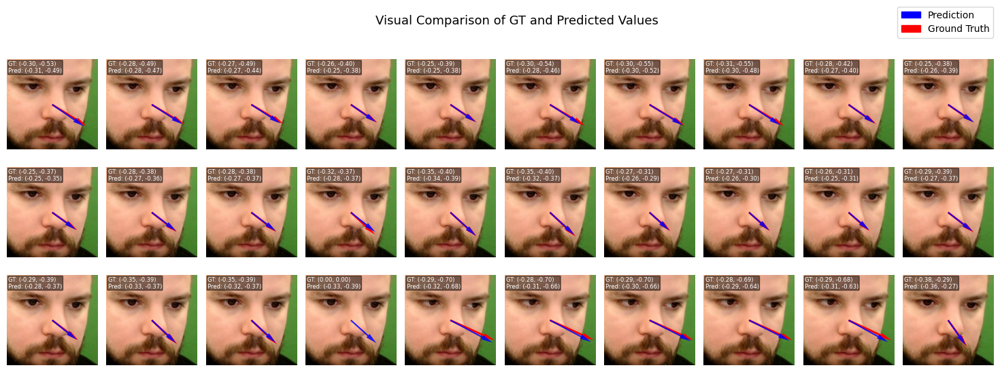

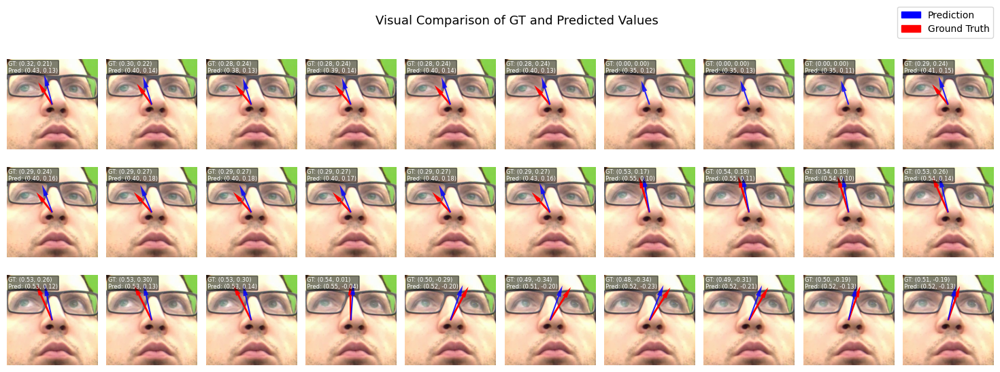

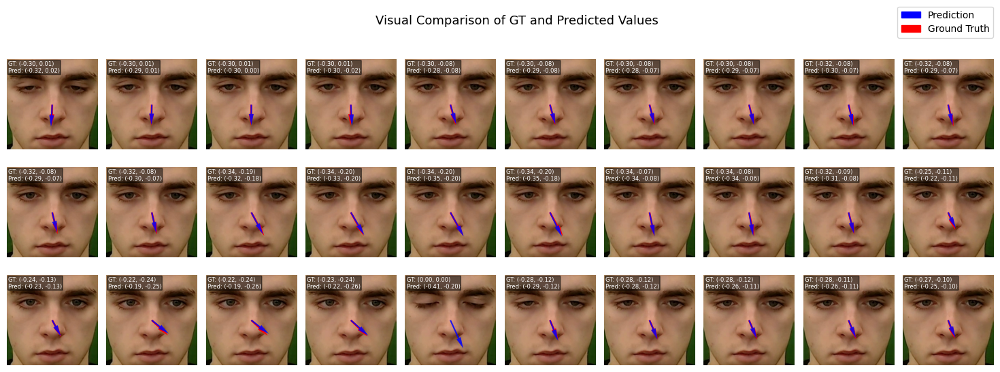

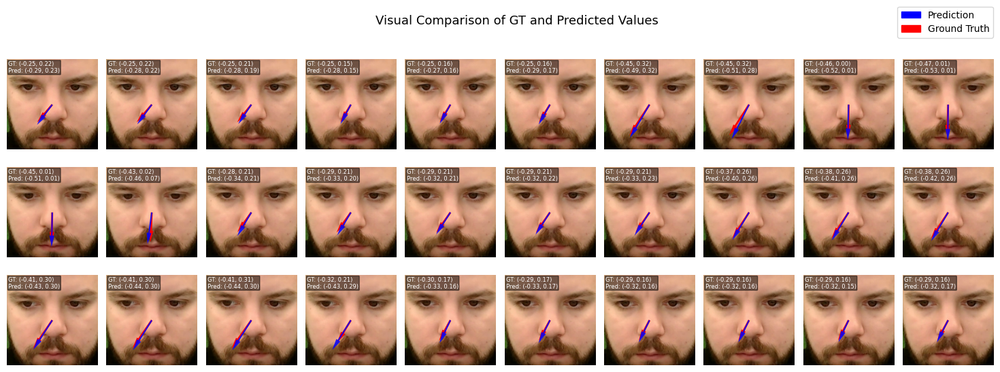

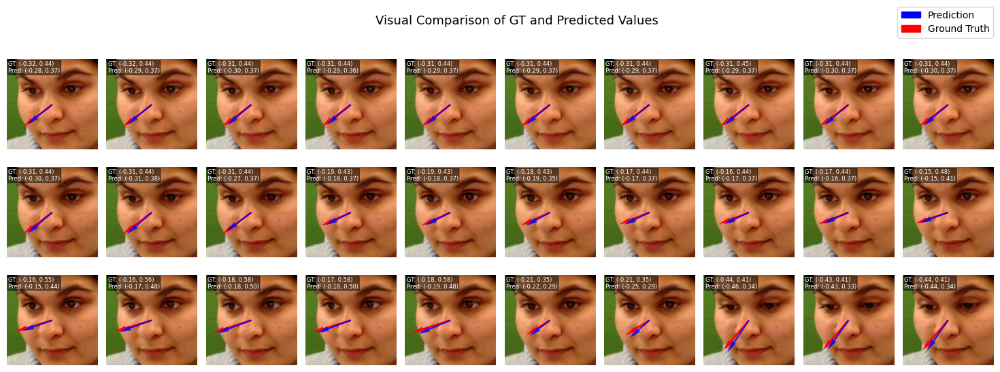

...

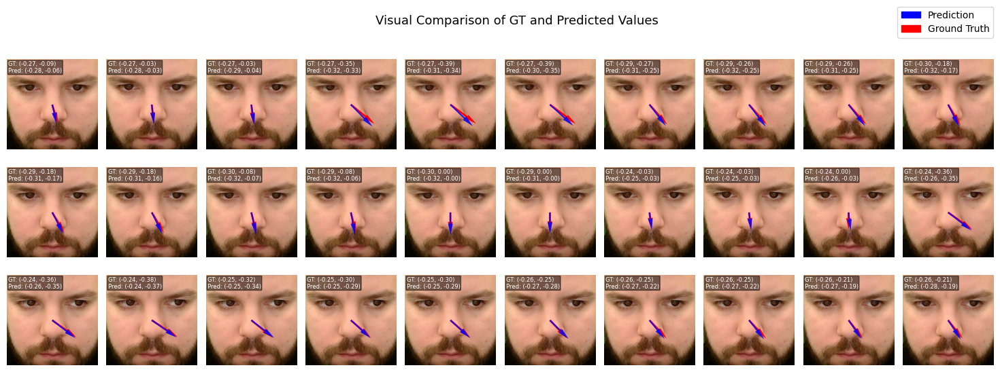

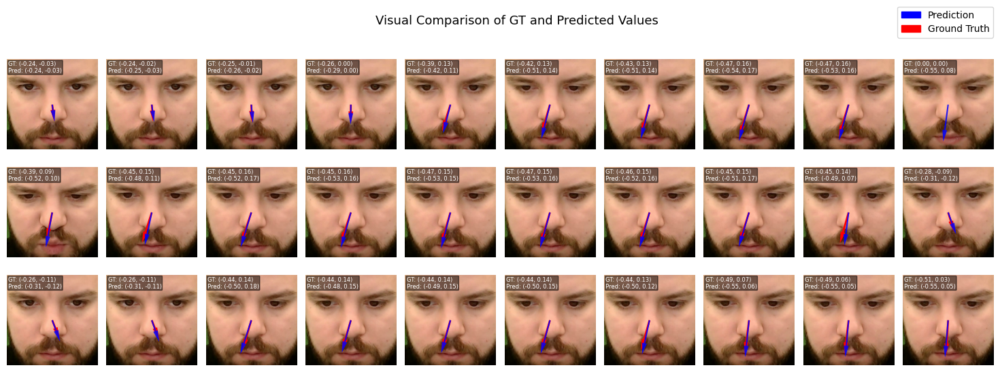

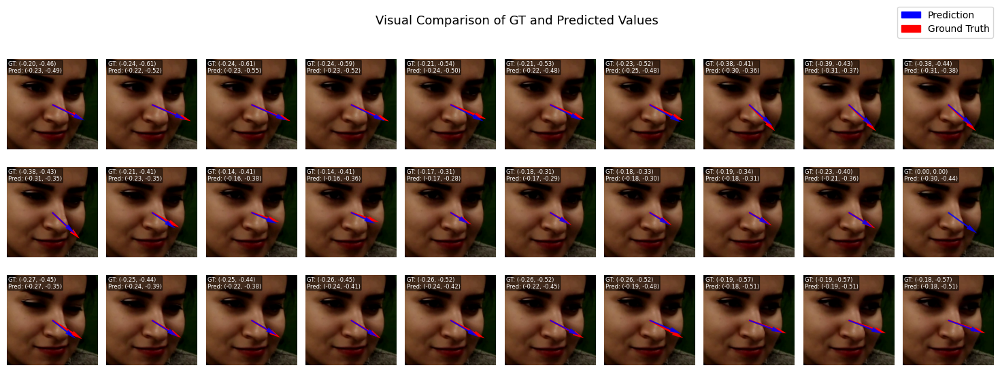

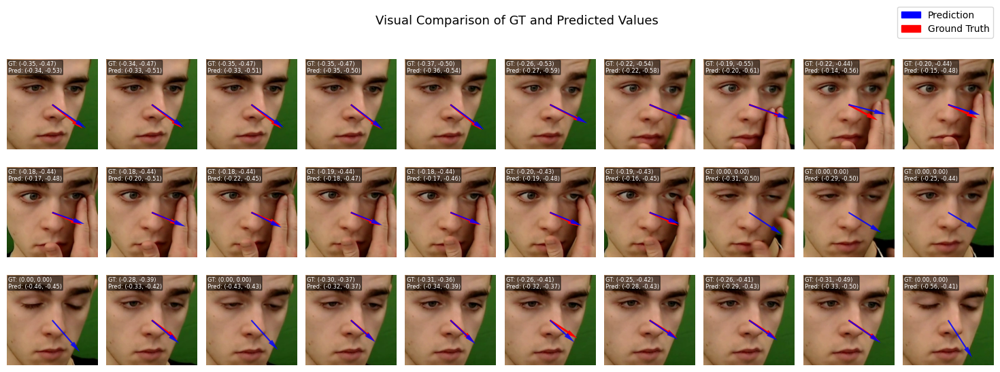

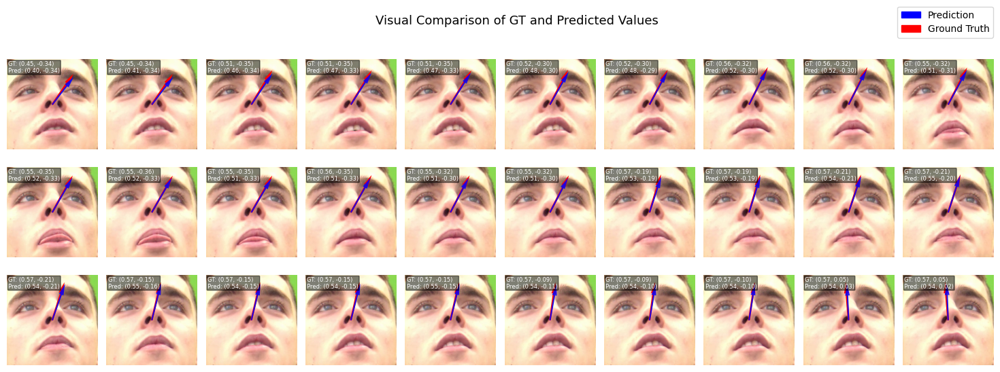